<a href="https://colab.research.google.com/github/SergeiShelgov/DetectBubble-with-neural-network/blob/main/DetectBubbleNeural.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Подключил необходимые библиотеки

In [ ]:
import cv2
from PIL import Image
import numpy as np
import requests
from google.colab.patches import cv2_imshow
import inspect
import math
from math import sqrt
import imutils
from google.colab import drive
drive.mount('/content/drive')
from google.colab import files
from PIL import Image
from io import BytesIO
from IPython.display import display

Mounted at /content/drive


In [ ]:
!python /content/drive/MyDrive/contentBuble/yolov5/train.py --img 640 --batch 16 --epochs 250 --data /content/drive/MyDrive/contentBuble/yolov5/data/custom_date.yaml --weights /content/drive/MyDrive/contentBuble/yolov5/yolov5s.pt --cache

train: weights=/content/drive/MyDrive/contentBuble/yolov5/yolov5s.pt, cfg=, data=/content/drive/MyDrive/contentBuble/yolov5/data/custom_date.yaml, hyp=drive/MyDrive/contentBuble/yolov5/data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=drive/MyDrive/contentBuble/yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 10 (delta 6), reused 9 (delta 6), pack-reused 1
Unpacking objects: 100% (10/10), done.
From https://github.com/ultralytics/yolov

In [ ]:
!python /content/drive/MyDrive/contentBuble/yolov5/detect.py --weights /content/drive/MyDrive/contentBuble/yolov5/runs/train/exp2/weights/last.pt --img 640 --conf 0.2 --source /content/drive/MyDrive/contentBuble/yolov5/data/images --save-txt


detect: weights=['/content/drive/MyDrive/contentBuble/yolov5/runs/train/exp2/weights/last.pt'], source=/content/drive/MyDrive/contentBuble/yolov5/data/images, data=drive/MyDrive/contentBuble/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=drive/MyDrive/contentBuble/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-69-g7830e91 torch 1.10.0+cu111 CPU

Fusing layers... 
Model summary: 213 layers, 7012822 parameters, 0 gradients
image 1/7 /content/drive/MyDrive/contentBuble/yolov5/data/images/1.jpg: 512x640 11 bubbles, Done. (0.329s)
image 2/7 /content/drive/MyDrive/contentBuble/yolov5/data/images/2.jpg: 544x640 10 bubbles, Done. (0.334s)
image 3/7 /content/drive/MyDrive/contentBuble/yolov5/

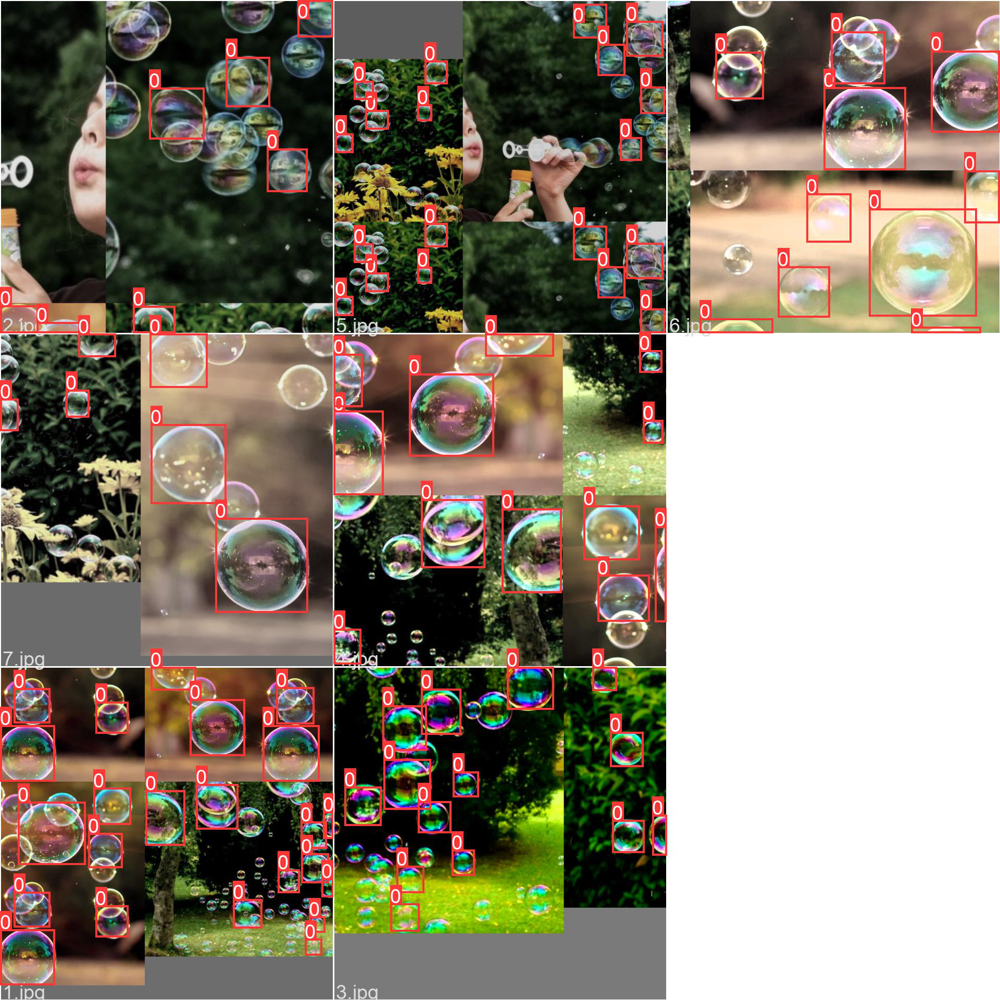

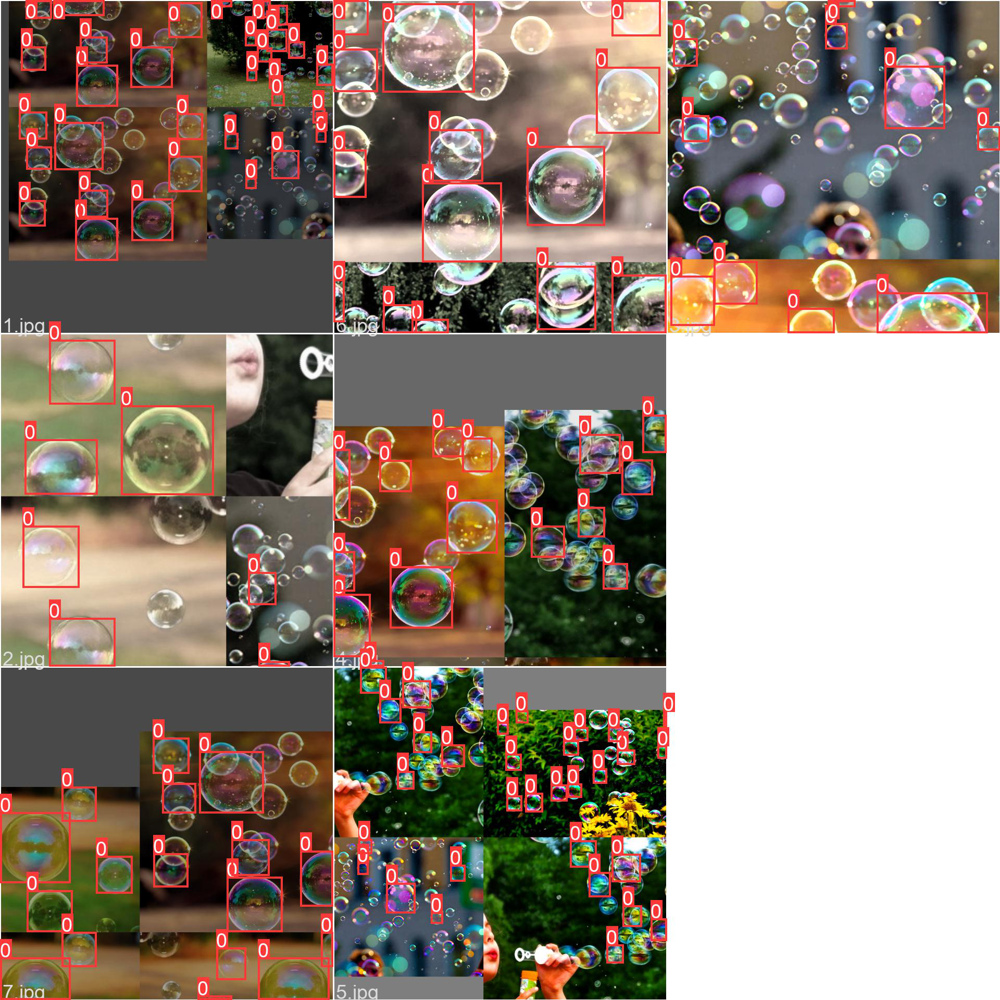

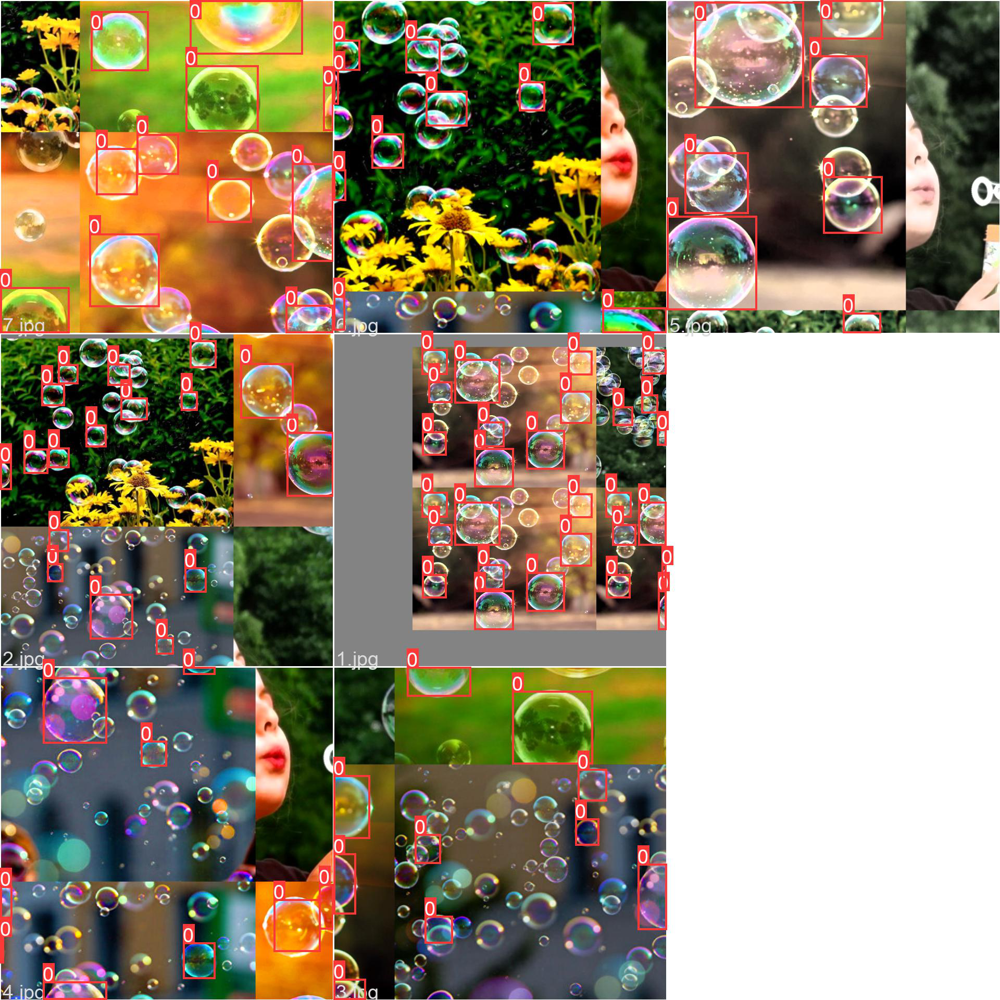

In [ ]:
path="/content/drive/MyDrive/contentBuble/yolov5/runs/train/exp"
ai = Image.open(path+'/train_batch2.jpg')
display(ai)
ai = Image.open(path+'/train_batch1.jpg')
display(ai)
ai = Image.open(path+'/train_batch0.jpg')
display(ai)

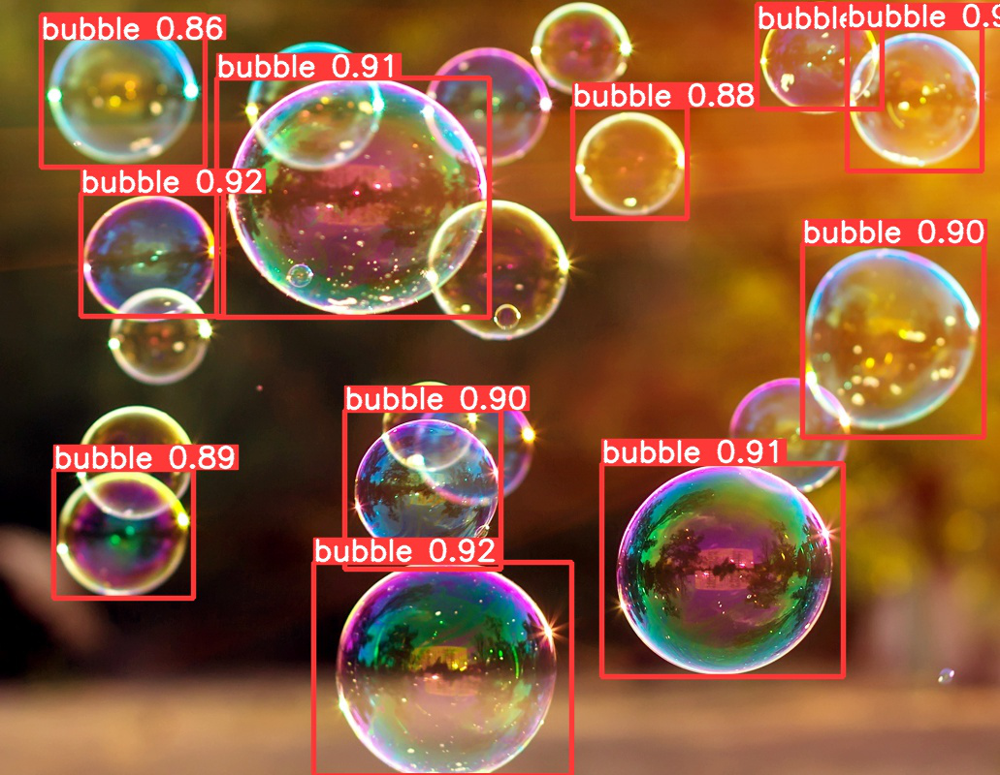

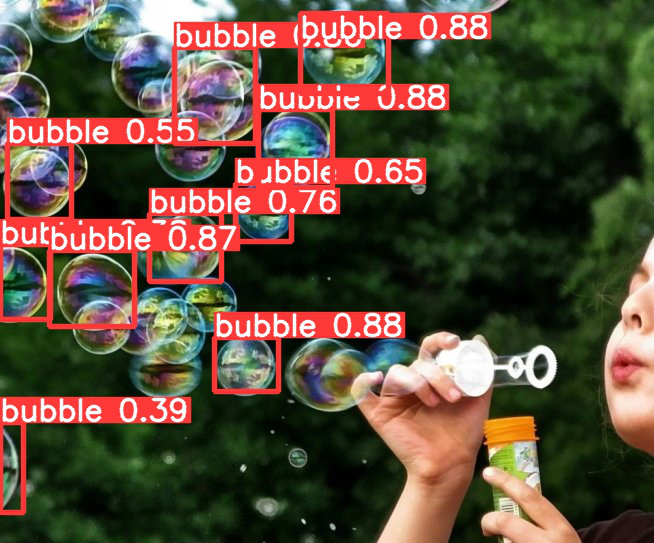

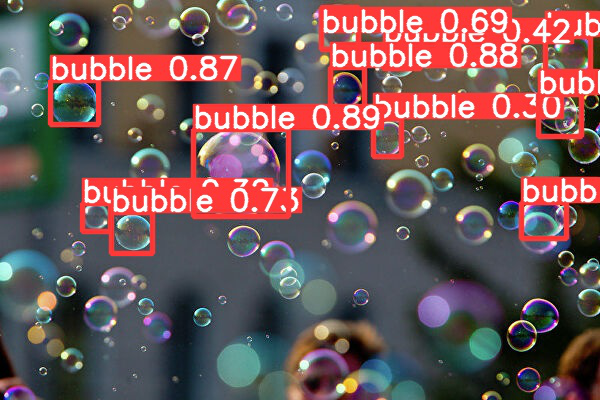

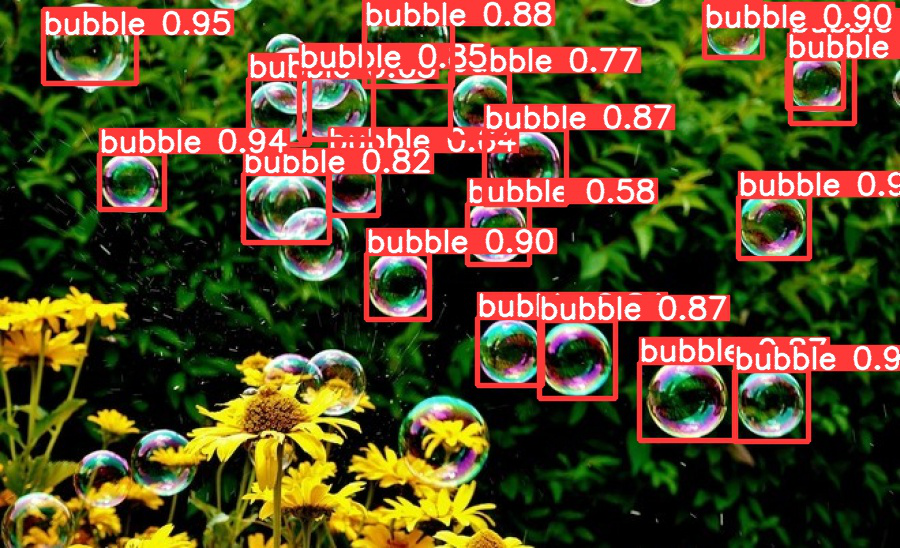

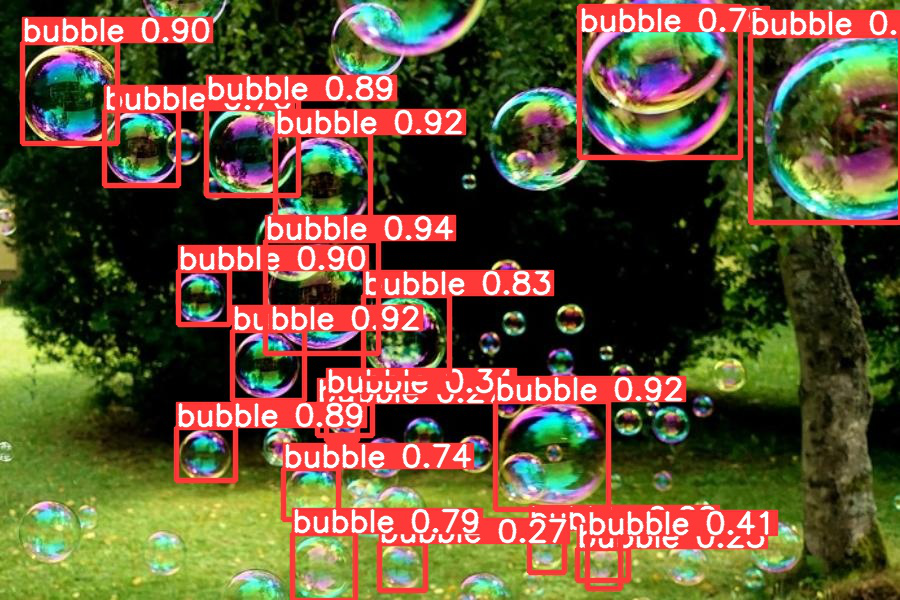

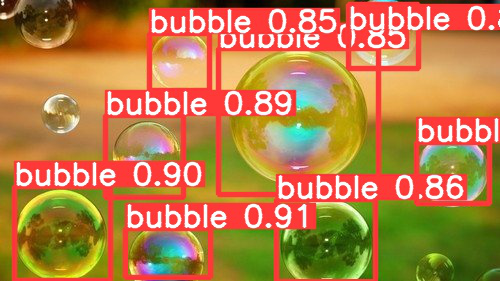

In [ ]:
path="/content/drive/MyDrive/contentBuble/yolov5/runs/detect/exp8"
ai = Image.open(path+'/1.jpg')
display(ai)
ai = Image.open(path+'/2.jpg')
display(ai)
ai = Image.open(path+'/3.jpg')
display(ai)
ai = Image.open(path+'/5.jpg')
display(ai)
ai = Image.open(path+'/6.jpg')
display(ai)
ai = Image.open(path+'/7.jpg')
display(ai)

In [ ]:
import os.path
numberExp =8
pathIm="/content/drive/MyDrive/contentBuble/yolov5/runs/detect/exp"+str(numberExp)

num_files = sum(os.path.isfile(os.path.join(pathIm, f)) for f in os.listdir(pathIm))
#print(num_files)
# height - высота
# weight - ширина

#<labels> <x> <y> <width> <height>

path="/content/drive/MyDrive/contentBuble/yolov5/runs/detect/exp"+str(numberExp)+"/labels"
for i in range(1,num_files):
  ai = Image.open(pathIm+'/'+ str(i) +'.jpg')
  ai = np.array(ai)
  radiusy=[]
  Vpuzirey=[]
  dh,dw, _ = ai.shape
  print(dh,dw)
  file1 = open(path + '/'+ str(i) +'.txt',"r")
  for string in file1:
        _, x, y, w, h = map(float, string.split(' '))
        x = int((x - w / 2) * dw)
        w = int(w * dw)
        y = int((y - h / 2) * dh)
        h = int(h * dh)
        radiusy.append(w/2)
        Vpuzirya=np.round((4*np.pi*(w/2)**3)/3).astype("int")
        cv2.putText(ai, "{:.0f}".format(Vpuzirya),(int(x+20), int(y + 40)), cv2.FONT_HERSHEY_SIMPLEX,0.65, (255, 255, 0), 2)
        Vpuzirey.append(Vpuzirya)
  Diametr=max(radiusy)*2
  #print(radiusy)
  #print(Diametr)
  #print(Vpuzirey)
  Vkartinki = Diametr * dh * dw
  SumVpusyrei=sum(Vpuzirey)
  #print(SumVpusyrei)
  concentration=np.round((SumVpusyrei/Vkartinki)*100,2)
  cv2.putText(ai,"bubble concentration: {:.2f}%".format(concentration),(int(dw/3), int(dh/1.01)), cv2.FONT_HERSHEY_SIMPLEX,0.65, (255, 255, 255), 2)
   # cv2.putText(ai, str(w), (x, y),cv2.FONT_HERSHEY_SIMPLEX,1, (0, 0, 0), 1,cv2.LINE_AA)
  ai = cv2.cvtColor(ai,cv2.COLOR_BGR2RGB)
  cv2_imshow(ai)

FileNotFoundError: ignored